# Gradients

Image gradient is a directional change in the intensity or color in an image
![alt text](Files/Edges/Gradient.png)

# Edges and Edge Detection

## What are edges?
- An edge point is a point in an image at the location of a significant local intensity change in the image.

---

## Why edges Appear?
- Depth Discontinuity.
- Surface color Discontinuity.
- Surface orientation Discontinuity.
- Illumination discontinuity.

![Image](../Files/rubik.jpg)
![Image](../Files/001.jpg)

---



In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

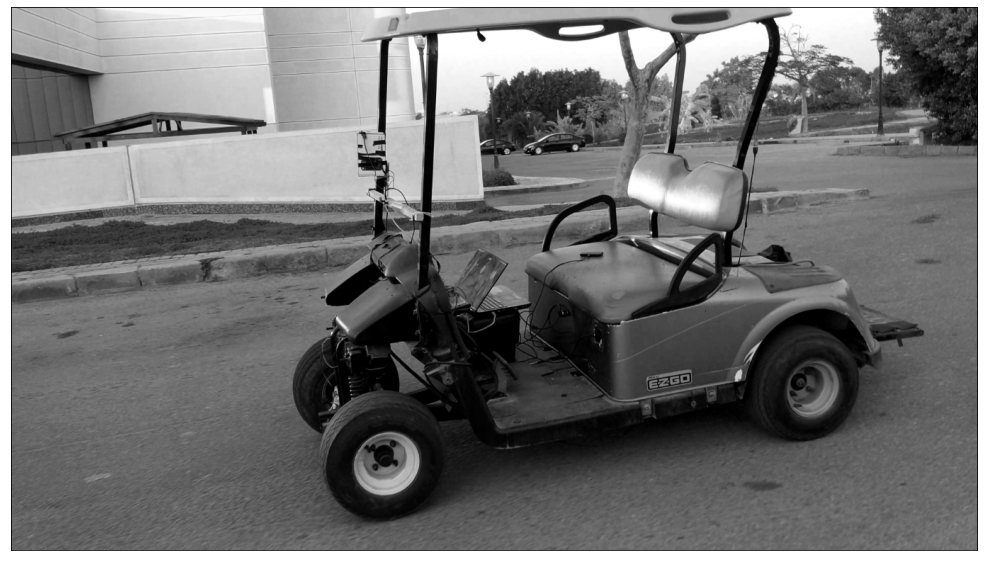

In [2]:
img = cv2.imread('../Files/001.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20,10))
plt.xticks([]); plt.yticks([])
plt.imshow(gray, cmap='gray');

# Solel

It is a filter that detects edges, it can be defined as a way of taking (an approximation) of the derivative of the image in the x or y direction, separately.

## 

## Sobel Y

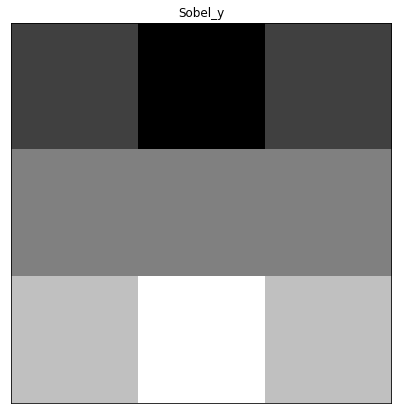

In [3]:
sobel_y = np.array([[ -1, -2, -1], 
                    [  0,  0, 0], 
                    [  1,  2, 1]])

plt.figure(figsize=(7,7))
plt.title('Sobel_y')
plt.xticks([]); plt.yticks([])
plt.imshow(sobel_y, cmap='gray');

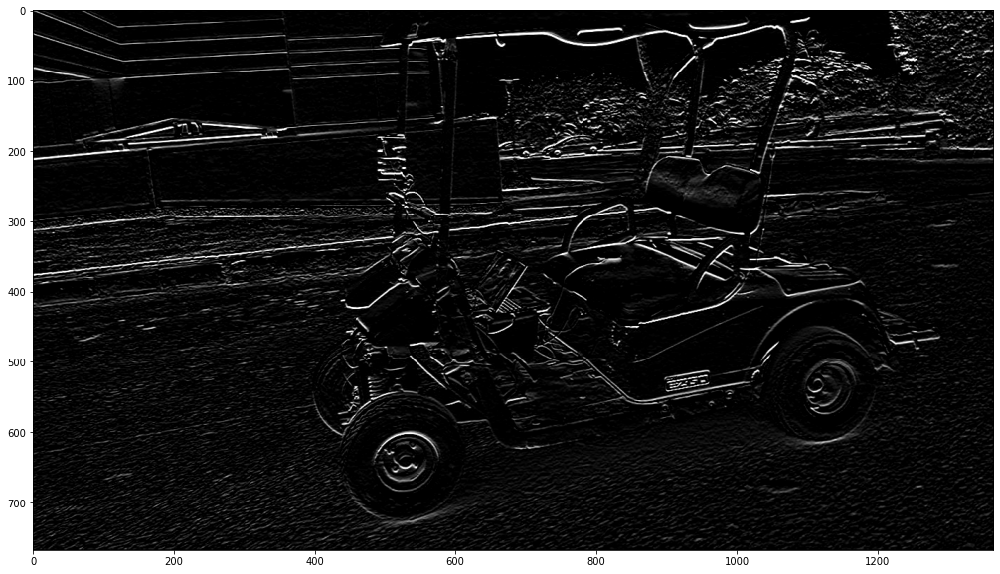

In [4]:
sobel_y = np.array([[ -1, -2, -1], 
                    [  0,  0, 0], 
                    [  1,  2, 1]])

filtered_image = cv2.filter2D(gray, -1, sobel_y)

plt.figure(figsize=(25,10))
plt.imshow(filtered_image, cmap='gray');

# Quick One

What do you think the result will be if we changed the filter to ?
```python
[  1,  2,  1],
[  0,  0,  0], 
[ -1, -2, -1] 
```

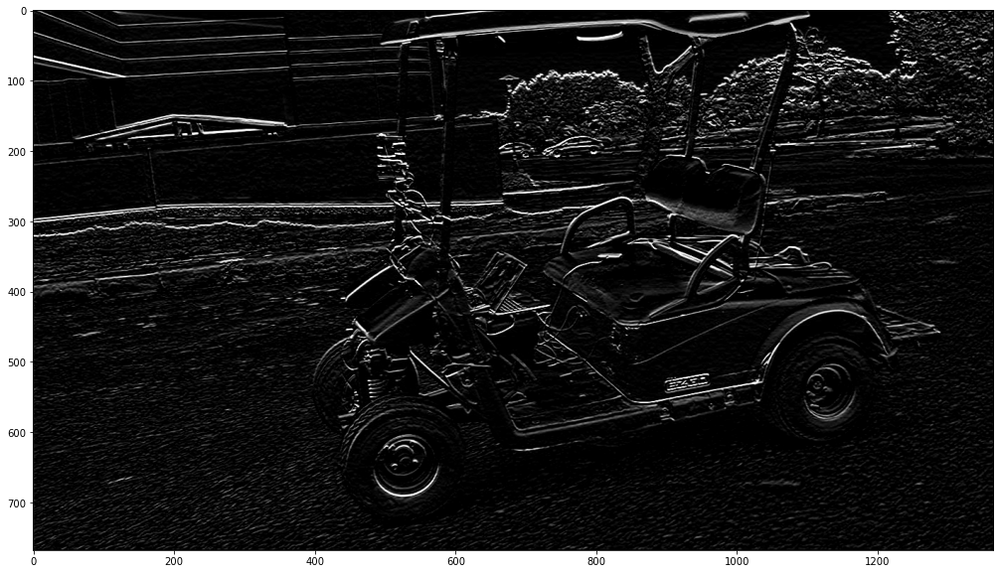

In [38]:
sobel_y = np.array([[  1,  2,  1], 
                    [  0,  0,  0], 
                    [ -1, -2, -1]])

filtered_image = cv2.filter2D(gray, -1, sobel_y)

plt.figure(figsize=(25,10))
plt.imshow(filtered_image, cmap='gray');

# Sobel x

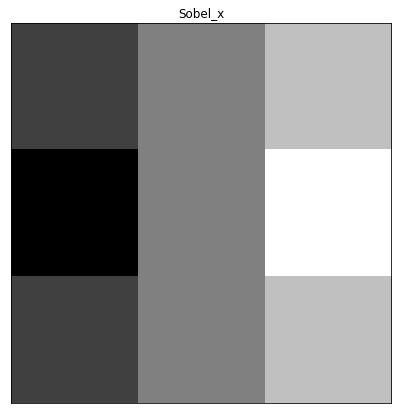

In [7]:
sobel_x = np.array([[ -1, 0, 1], 
                    [ -2, 0, 2], 
                    [ -1, 0, 1]])

plt.figure(figsize=(7,7))
plt.title('Sobel_x')
plt.xticks([]); plt.yticks([])
plt.imshow(sobel_x, cmap='gray');

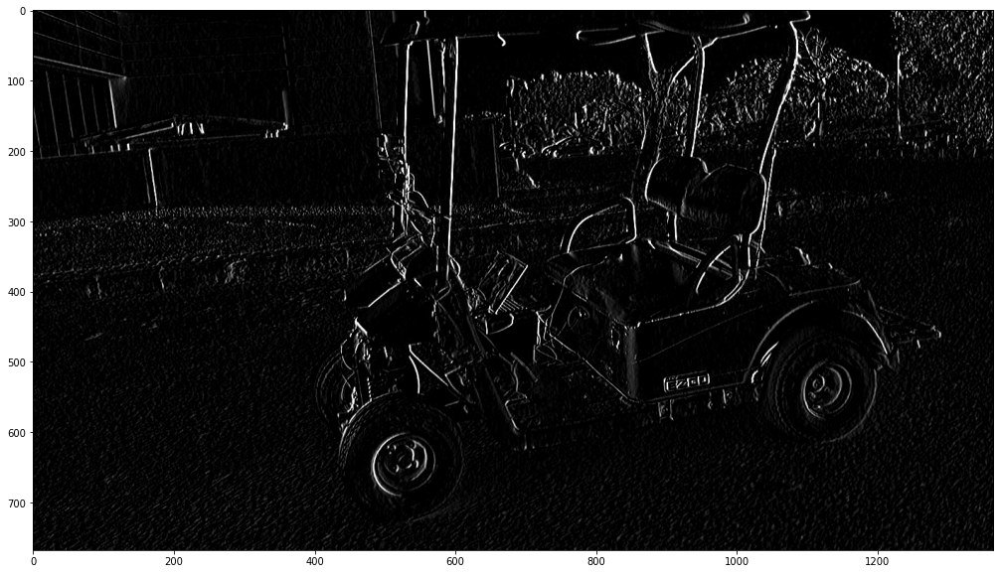

In [8]:
sobel_x = np.array([[ -1, 0, 1], 
                    [ -2, 0, 2], 
                    [ -1, 0, 1]])

filtered_image = cv2.filter2D(gray, -1, sobel_x)

plt.figure(figsize=(25,10))
plt.imshow(filtered_image, cmap='gray');

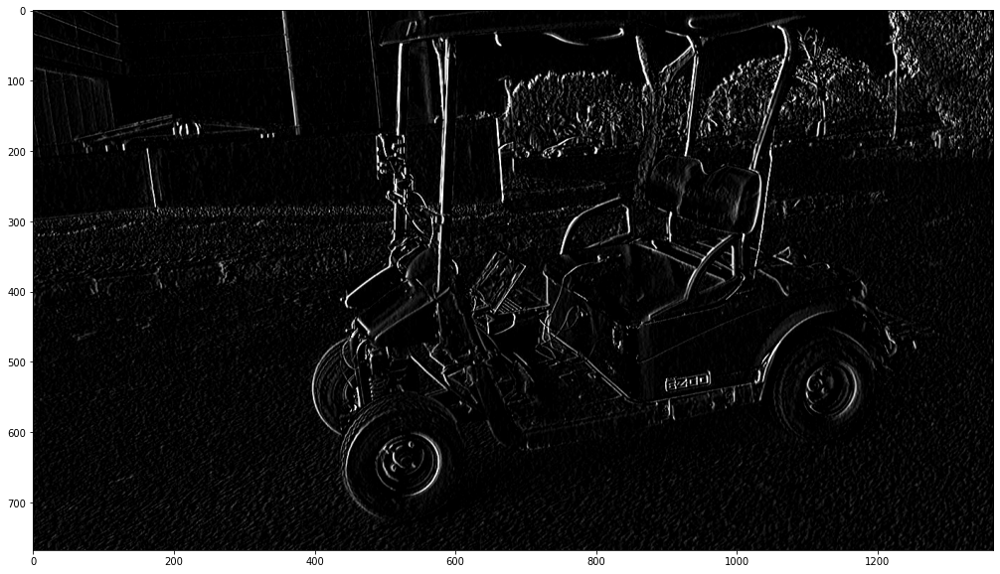

In [9]:
sobel_x = np.array([[ 1, 0, -1], 
                    [ 2, 0, -2], 
                    [ 1, 0, -1]])

filtered_image = cv2.filter2D(gray, -1, sobel_x)

plt.figure(figsize=(25,10))
plt.imshow(filtered_image, cmap='gray');

# It's playing around time

In [16]:
def nothing(x):
    pass

cv2.namedWindow('Image')

cv2.createTrackbar('x', 'Image', 0, 1, nothing)
cv2.createTrackbar('y', 'Image', 0, 1, nothing)
cv2.createTrackbar('kSize', 'Image', 0, 30, nothing)

while (1):
    x = cv2.getTrackbarPos('x','Image')
    y = cv2.getTrackbarPos('y','Image')
    kSize = cv2.getTrackbarPos('kSize','Image')
    if (kSize % 2 == 0):
        kSize += 1
    if (x == 1 or y == 1):
        sobel = cv2.Sobel(gray, cv2.CV_8U, x, y, ksize=kSize)
    else:
        sobel = gray.copy()
    cv2.imshow('Image', sobel)
    k = cv2.waitKey(1) & 0xFF
    if k == 27:
        break
    
cv2.destroyAllWindows()

# Laplacian

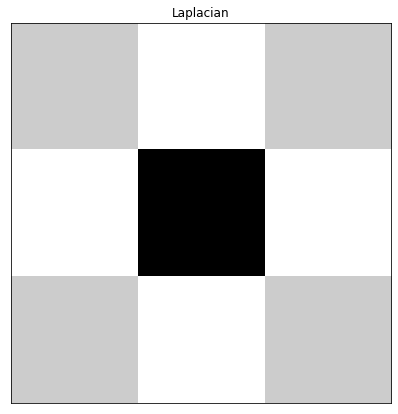

In [19]:
laplacian = np.array([[ 0,  1, 0], 
                      [ 1, -4, 1], 
                      [ 0,  1, 0]])

plt.figure(figsize=(7,7))
plt.title('Laplacian')
plt.xticks([]); plt.yticks([])
plt.imshow(laplacian, cmap='gray');

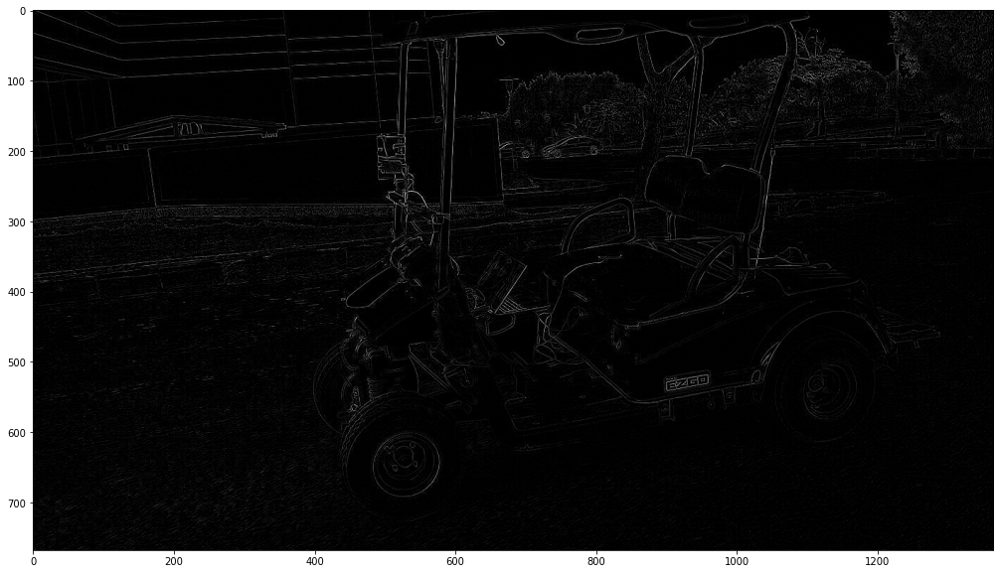

In [21]:
laplacian = np.array([[ 0,  1, 0], 
                      [ 1, -4, 1], 
                      [ 0,  1, 0]])

filtered_image = cv2.filter2D(gray, -1, laplacian)

plt.figure(figsize=(25,10))
plt.imshow(filtered_image, cmap='gray');

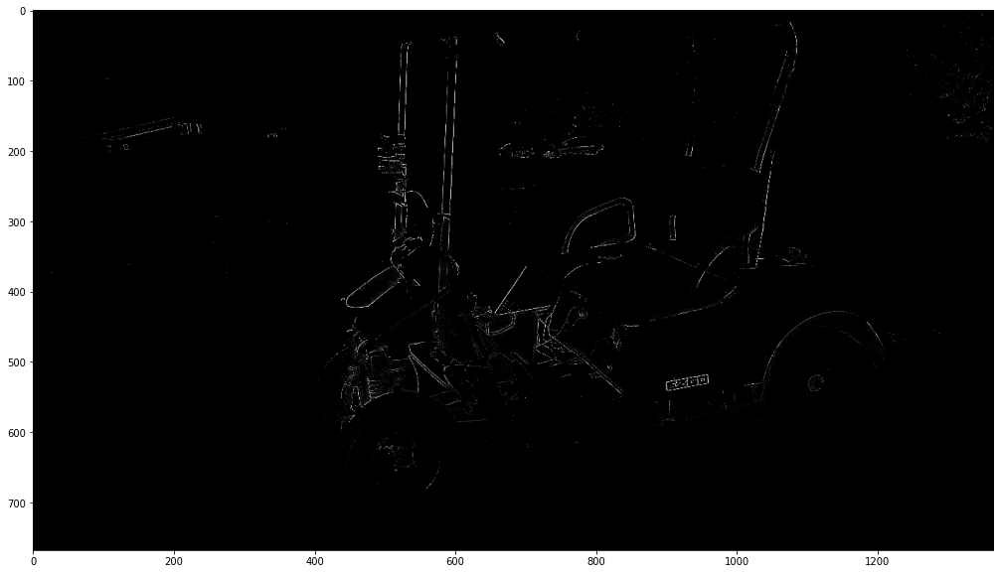

In [30]:
laplacian = np.array([[ 0,   3, 0], 
                      [ 3,  -20, 3], 
                      [ 0,   3, 0]])

filtered_image = cv2.filter2D(gray, -1, laplacian)

plt.figure(figsize=(25,10))
plt.imshow(filtered_image, cmap='gray');

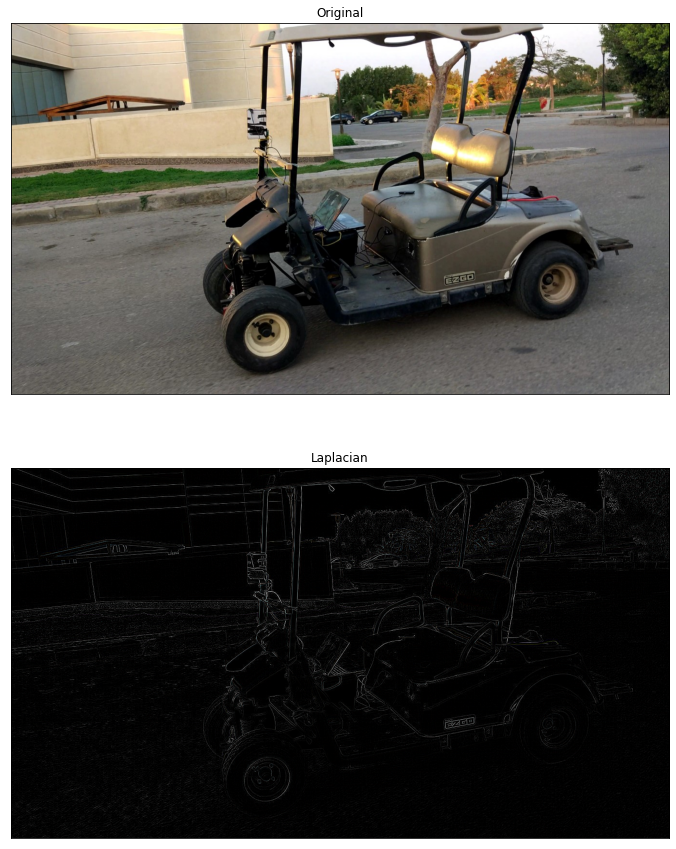

In [52]:
laplacian = cv2.Laplacian(img, cv2.CV_8U)

plt.figure(figsize=(30,15), facecolor=(1, 1, 1))

plt.subplot(2,1,1),plt.imshow(img[:,:,::-1])
plt.title('Original'), plt.xticks([]), plt.yticks([])

plt.subplot(2,1,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.show();

# Canny

![Image](Files/Edges/canny.png)

In [31]:
edges = cv2.Canny(gray, 50, 150)

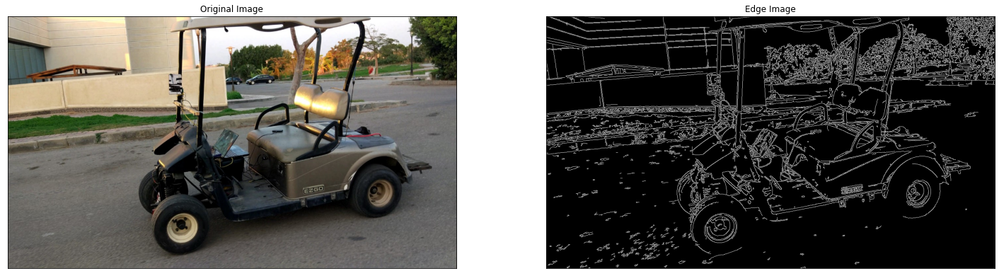

In [32]:
plt.figure(figsize=(25, 15))
plt.subplot(121), plt.imshow(img[:,:,::-1], cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show()

In [35]:
def nothing(x):
    pass

cv2.namedWindow('Image')

cv2.createTrackbar('x', 'Image', 0, 300, nothing)
cv2.createTrackbar('y', 'Image', 0, 300, nothing)
cv2.createTrackbar('ks', 'Image', 0, 100, nothing)
cv2.createTrackbar('blur', 'Image', 0, 1, nothing)


while (1):
    x = cv2.getTrackbarPos('x','Image')
    y = cv2.getTrackbarPos('y','Image')
    ks = cv2.getTrackbarPos('ks', 'Image')
    bl = cv2.getTrackbarPos('blur','Image')
    edges = []
    if bl:
        if (ks%2 == 0):
            ks += 1
        blur = cv2.GaussianBlur(gray, (ks, ks), 0)
        edges = cv2.Canny(blur, x, y)
    else:
        edges = cv2.Canny(gray, x, y)
    cv2.imshow('Image', edges)
    k = cv2.waitKey(1) & 0xFF
    if k == 27:
        break
    
cv2.destroyAllWindows()